In [1]:
pip install ipython

Note: you may need to restart the kernel to use updated packages.


In [2]:
%matplotlib inline

In [3]:
from __future__ import print_function, division
import torch
import cv2
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import pandas as pd
import numpy as np
import csv
import os
import tarfile
from urllib.parse import urlparse
from urllib.request import urlretrieve
import numpy as np
import torch
from torch.utils.data import Dataset
from PIL import Image
from tqdm import tqdm
from torch.utils.data import DataLoader
from torchvision import transforms
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
cudnn.benchmark = True
plt.ion()   # interactive mode

In [4]:
import os

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [6]:
!pip install -q livelossplot==0.3.3
!pip install -q ipython-autotime
%load_ext autotime

time: 508 µs (started: 2022-10-31 06:55:24 +00:00)


In [7]:
#helper function
def get_label(row):
  for c in labels.columns:
    if row[c]==1:
      return c

labels = pd.read_csv('../input/isiccsvfile/ISIC_2019_Training_GroundTruth.csv')
labels['l']=labels.apply(get_label, axis=1)
X=labels.drop(['l','UNK'], axis=1)
y = labels['l']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.21, random_state=42,stratify=y)
X_train['image'] = '../input/pp1isic/preprocessed-hair/'+X_train['image']+ '.jpg'
X_test['image'] = '../input/pp1isic/preprocessed-hair/'+X_test['image']+ '.jpg'
X_test.to_csv('validation.csv', index=False)
X_train.to_csv('training.csv', index=False)
train_path = 'training.csv'
class_path = 'validation_class.csv'
eval_path = 'validation.csv'
train_img_path = '../input/pp1isic/preprocessed-hair'


time: 743 ms (started: 2022-10-31 06:55:24 +00:00)


In [8]:
class_names = ['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']

def read_object_labels_csv(file,phase, header=True):
    img_t=[]
    if phase == 'Train':
      dir = 'training.csv'
    elif phase == "Valid":
      dir = 'validation.csv'
    with open(dir, "r") as f:
        csvReader = csv.reader(f)
        next(csvReader, None)
        k=0
        for line in csvReader:
            k+=1
            image_name= line[0]
            label = line[1:9]
            label = torch.from_numpy(np.array(label, dtype=np.float64))
            item = (image_name,label)
            img_t.append(item)
    return img_t


class CHEXPERT(Dataset):
    def __init__(self, root, phase, csv_path,transform=None):
        self.root = os.path.abspath(root)
        self.phase = phase
        self.transform = transform
        self.path_images = self.root
        file_csv = pd.read_csv(csv_path)
        self.classes = class_names
        self.images = read_object_labels_csv(file_csv,phase)
        print('[dataset] classification phase={} number of classes={}  number of images={}'.format(phase, len(self.classes), len(self.images)))

    def __getitem__(self, index):
        filename, target = self.images[index]
        filename = filename
        img = Image.open(filename).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        
        data = {'image':img, 'target': target}
        return data

    def __len__(self):
        return len(self.images)

    def get_number_classes(self):
        return len(self.classes)


time: 2.31 ms (started: 2022-10-31 06:55:25 +00:00)


In [9]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
train_dataset = CHEXPERT(train_img_path, transform=data_transforms['train'], phase='Train',csv_path=train_path)
val_dataset = CHEXPERT(train_img_path, transform=data_transforms['val'],phase='Valid',csv_path=eval_path)

image_datasets ={'train': train_dataset, 'val': val_dataset}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,shuffle=False, num_workers=2)for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

[dataset] classification phase=Train number of classes=9  number of images=20011
[dataset] classification phase=Valid number of classes=9  number of images=5320
time: 294 ms (started: 2022-10-31 06:55:25 +00:00)


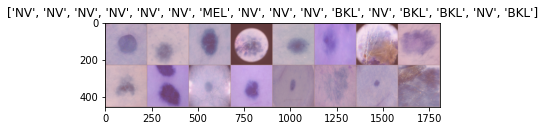

time: 870 ms (started: 2022-10-31 06:55:25 +00:00)


In [10]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.6678, 0.5298, 0.5245])
    std = np.array([0.1333, 0.1476, 0.1590])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
data = next(iter(dataloaders['train']))
ps = data['target'].numpy()
l = np.where(ps==1.0)
l = l[1].astype(int)
# Make a grid from batch
out = torchvision.utils.make_grid(data['image'])
imshow(out, title=[class_names[x] for x in l])

In [11]:
model=models.densenet121(pretrained=False)
model.classifier=nn.Sequential(nn.Linear(1024, 8), nn.Sigmoid())
checkpoint = torch.load('../input/isic2019hairdensenet121/resnet50_wt_epoch_17_batch_78_auc_0.6648.pt')
model.load_state_dict(checkpoint['model_state_dict'],strict=False)
del checkpoint
model.to(device)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

time: 4.27 s (started: 2022-10-31 06:55:26 +00:00)


In [12]:
class FusionMatrix(object):
    def __init__(self, num_classes):
        self.num_classes = num_classes
        self.matrix = np.zeros((self.num_classes, self.num_classes), dtype=int)

    def update(self, output, label):
        length = output.shape[0]
        for i in range(length):
            self.matrix[int(output[i]), int(label[i])] += 1

    def get_fusion_matrix(self):
        return self.matrix

    def get_rec_per_class(self):
        rec = np.array(
            [
                self.matrix[i, i] / self.matrix[:, i].sum()
                for i in range(self.num_classes)
            ]
        )
        rec[np.isnan(rec)] = 0
        return rec

    def get_pre_per_class(self):
        pre = np.array(
            [
                self.matrix[i, i] / self.matrix[i, :].sum()
                for i in range(self.num_classes)
            ]
        )
        pre[np.isnan(pre)] = 0
        return pre

    def get_accuracy(self):
        acc = (
            np.sum([self.matrix[i, i] for i in range(self.num_classes)])
            / self.matrix.sum()
        )
        return acc

    # convert multi-classification into binary classification tasks, and calculate the accuracy.
    def get_binary_accuracy(self, class_no):
        class_no = int(class_no)
        if class_no >= self.num_classes or class_no < 0:
            raise AttributeError(
                "Parameter class_no must less than the number of class.")

        error_num = 0
        for i in range(self.num_classes):
            error_num += self.matrix[i, class_no]
            error_num += self.matrix[class_no, i]
        error_num -= 2 * self.matrix[class_no, class_no]
        ok_num = self.matrix.sum() - error_num
        acc = ok_num / self.matrix.sum()
        return acc

    def get_balance_accuracy(self):
        rec = self.get_rec_per_class()
        bacc = np.mean(rec)
        return bacc

    def get_f1_score(self):
        recall = self.get_rec_per_class()
        precision = self.get_pre_per_class()
        f1_score = 2 * (precision * recall) / (precision + recall)
        f1_score[np.isnan(f1_score)] = 0
        return np.mean(f1_score)

    def plot_confusion_matrix(self, normalize = False, cmap=plt.cm.Blues):
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

        # Compute confusion matrix
        cm = self.matrix.T

        fig, ax = plt.subplots()
        im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
        ax.figure.colorbar(im, ax=ax)
        # We want to show all ticks...
        ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               # ... and label them with the respective list entries
               xticklabels=np.arange(self.num_classes), yticklabels=np.arange(self.num_classes),
               title=title,
               ylabel='True label',
               xlabel='Predicted label')

        # Rotate the tick labels and set their alignment.
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
                 rotation_mode="anchor")

        # Loop over data dimensions and create text annotations.
        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black")
        fig.tight_layout()
        return fig

time: 3.41 ms (started: 2022-10-31 06:55:30 +00:00)


In [13]:
from tqdm._tqdm_notebook import tqdm_notebook
def compute_predictions(model):
    model.eval()
    fusion_matrix = FusionMatrix(8)
    pred_lst=[]
    gt_lst=[]
    for i, sample in enumerate(dataloaders['val']):    
        images=sample['image']
        labels=sample['target']
        del sample
        images = images.to(device)
        labels=labels.numpy()
        outputs=model(images)
        outputs=outputs.detach()
        outputs=outputs.cpu()
        outputs=outputs.numpy()
        pred_lst.append(outputs)
        gt_lst.append(labels)
        del labels, outputs, images

    pred_lst=np.concatenate(pred_lst, axis=0)
    gt_lst=np.concatenate(gt_lst, axis=0)
    pred_lst2 = np.argmax(pred_lst, axis=1)
    gt_lst2 = np.argmax(gt_lst, axis=1)
    fusion_matrix.update(pred_lst2, gt_lst2)
    print("sensitivity-"+str(fusion_matrix.get_rec_per_class()))
    print("specicivity-"+str(fusion_matrix.get_pre_per_class()))
    print("Balanced Accuracy")
    print(fusion_matrix.get_balance_accuracy())
    print("Confusion Matrix")
    print(fusion_matrix.plot_confusion_matrix())
    print("f1-score")
    print(fusion_matrix.get_f1_score())
    
    #roc_auc = get_roc_auc(pred_lst, gt_lst)
    #print(roc_auc)
    auc_lst=[]
    acc_lst=[]
    for k in range(0,8):
        tmp_gt=gt_lst[:, k]
        tmp_pred=pred_lst[:,k]
        tmp_acc=accuracy_score(tmp_gt, tmp_pred.round())
        acc_lst.append(tmp_acc)
        tmp_auc=roc_auc_score(tmp_gt, tmp_pred)
        auc_lst.append(tmp_auc)

    
    auc_lst=np.array(auc_lst)
    
    acc_lst=np.array(acc_lst)
    print("auc-list")
    print('\n')
    print(auc_lst)
    print("accuracy-list")
    print('\n')
    print(acc_lst)
    auc=np.mean(auc_lst)
    acc = np.mean(acc_lst)
    print("mean-auc"+str(auc))
    print("mean-auc"+str(acc))
    f1s=0.0
    return auc,acc,pred_lst,gt_lst

time: 3.81 ms (started: 2022-10-31 06:55:30 +00:00)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  """Entry point for launching an IPython kernel.


sensitivity-[0.41789474 0.90495562 0.27077364 0.00549451 0.         0.
 0.         0.        ]
specicivity-[0.40345528 0.63856994 0.37574553 1.         0.         0.
 0.         0.        ]
Balanced Accuracy
0.1998898128258584
Confusion Matrix
Figure(432x288)
f1-score
0.18562384712187668
auc-list


[0.74804854 0.85478254 0.76682343 0.66956506 0.66135706 0.64624668
 0.35814129 0.60625847]
accuracy-list


[0.83515038 0.71484962 0.86879699 0.96578947 0.89642857 0.9906015
 0.99003759 0.97518797]
mean-auc0.6639028828036856
mean-auc0.9046052631578947


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in long_scalars
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide


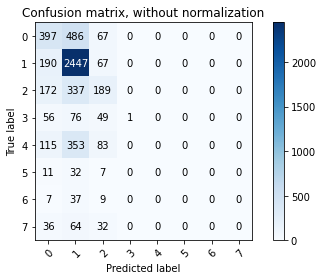

time: 33.1 s (started: 2022-10-31 06:55:30 +00:00)


In [14]:
auc1,acc1,pred_lst1,gt_lst1=compute_predictions(model)

In [15]:
pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 10.6 MB/s eta 0:00:00
  Installing build dependencies ... - \ | / - \ done
  Getting requirements to build wheel ... - done
  Preparing metadata (pyproject.toml) ... - done
  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38242 sha256=ba958f86400d433a3b9d6d58d4a3565387bdf8bed0ed204229d701714eecb0f5
  Stored in directory: /root/.cache/pip/wheels/a4/6a/11/fa213a7aaae1a99a800b86bdd1cc95bc9c7d7914b0859663b8
Successfully built grad-cam
Note: you may need to restart the kernel to use updated packages.
time: 23.8 s (started: 2022-10-31 06:56:04 +00:00)


In [16]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

time: 88.7 ms (started: 2022-10-31 06:56:27 +00:00)


In [17]:
from PIL import Image
from matplotlib.pyplot import imshow
from torchvision import models, transforms
from torchvision.utils import save_image

time: 545 µs (started: 2022-10-31 06:56:27 +00:00)


(224, 224)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  This is separate from the ipykernel package so we can avoid doing imports until


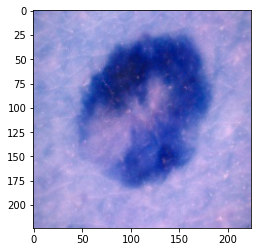

time: 238 ms (started: 2022-10-31 06:56:28 +00:00)


In [18]:
image = Image.open('../input/pp1isic/preprocessed-hair/ISIC_0033754.jpg').convert('RGB')
imshow(image)
image = image.resize((224, 224), Image.ANTIALIAS)

print(image.size)
image = np.array(image)
image2 = np.float32(image) / 255

In [19]:
print(model)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [20]:
image1 = Image.open('../input/pp1isic/preprocessed-hair/ISIC_0033754.jpg').convert('RGB')
preprocess = data_transforms['val']
tensor = preprocess(image1)
tensor2 = tensor.unsqueeze(0)
tensor2 = tensor2.float()

time: 5.34 ms (started: 2022-10-31 06:56:28 +00:00)


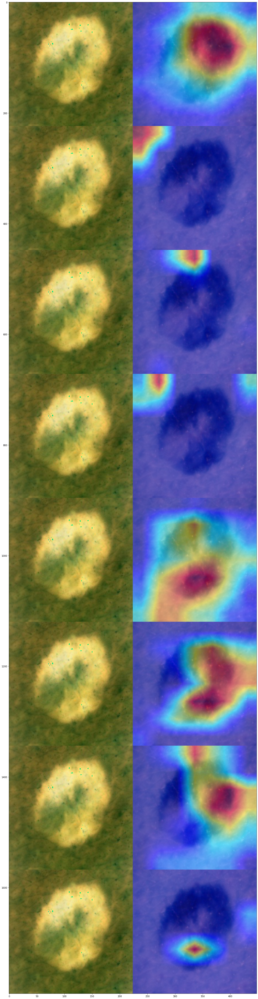

time: 5.8 s (started: 2022-10-31 06:56:28 +00:00)


In [21]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))

(224, 224)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  This is separate from the ipykernel package so we can avoid doing imports until


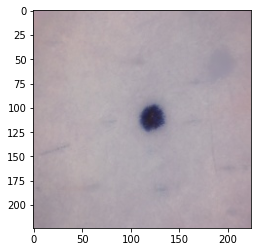

time: 385 ms (started: 2022-10-31 06:56:34 +00:00)


In [22]:
image = Image.open('../input/pp1isic/preprocessed-hair/ISIC_0033724.jpg').convert('RGB')
imshow(image)
image = image.resize((224, 224), Image.ANTIALIAS)

print(image.size)
image = np.array(image)
image2 = np.float32(image) / 255

In [23]:
image1 = Image.open('../input/pp1isic/preprocessed-hair/ISIC_0033724.jpg').convert('RGB')
preprocess = data_transforms['val']
tensor = preprocess(image1)
tensor2 = tensor.unsqueeze(0)
tensor2 = tensor2.float()

time: 5.01 ms (started: 2022-10-31 06:56:35 +00:00)


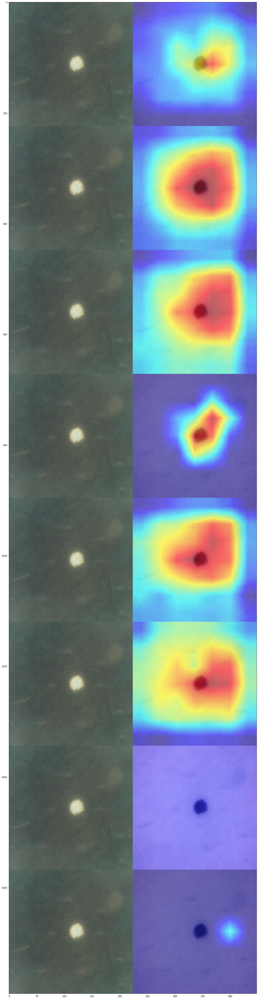

time: 3.04 s (started: 2022-10-31 06:56:35 +00:00)


In [24]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))

In [25]:
#helper function
def get_label(row):
  for c in labels.columns:
    if row[c]==1:
      return c

labels = pd.read_csv('../input/isiccsvfile/ISIC_2019_Training_GroundTruth.csv')
labels['l']=labels.apply(get_label, axis=1)
X=labels.drop(['l','UNK'], axis=1)
y = labels['l']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.21, random_state=42,stratify=y)
X_train['image'] = '../input/pp2isic/preprocessed-segment/'+X_train['image']+ '.jpg'
X_test['image'] = '../input/pp2isic/preprocessed-segment/'+X_test['image']+ '.jpg'
X_test.to_csv('validation.csv', index=False)
X_train.to_csv('training.csv', index=False)
train_path = 'training.csv'
class_path = 'validation_class.csv'
eval_path = 'validation.csv'
train_img_path = '../input/pp2isic/preprocessed-segment'


time: 693 ms (started: 2022-10-31 06:56:38 +00:00)


In [26]:
class_names = ['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']

def read_object_labels_csv(file,phase, header=True):
    img_t=[]
    if phase == 'Train':
      dir = 'training.csv'
    elif phase == "Valid":
      dir = 'validation.csv'
    with open(dir, "r") as f:
        csvReader = csv.reader(f)
        next(csvReader, None)
        k=0
        for line in csvReader:
            k+=1
            image_name= line[0]
            label = line[1:9]
            label = torch.from_numpy(np.array(label, dtype=np.float64))
            item = (image_name,label)
            img_t.append(item)
    return img_t


class CHEXPERT(Dataset):
    def __init__(self, root, phase, csv_path,transform=None):
        self.root = os.path.abspath(root)
        self.phase = phase
        self.transform = transform
        self.path_images = self.root
        file_csv = pd.read_csv(csv_path)
        self.classes = class_names
        self.images = read_object_labels_csv(file_csv,phase)
        print('[dataset] classification phase={} number of classes={}  number of images={}'.format(phase, len(self.classes), len(self.images)))

    def __getitem__(self, index):
        filename, target = self.images[index]
        filename = filename
        img = Image.open(filename).convert('RGB')
        if self.transform is not None:
            img = self.transform(img)
        
        data = {'image':img, 'target': target}
        return data

    def __len__(self):
        return len(self.images)

    def get_number_classes(self):
        return len(self.classes)


time: 1.99 ms (started: 2022-10-31 06:56:39 +00:00)


In [27]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
train_dataset = CHEXPERT(train_img_path, transform=data_transforms['train'], phase='Train',csv_path=train_path)
val_dataset = CHEXPERT(train_img_path, transform=data_transforms['val'],phase='Valid',csv_path=eval_path)

image_datasets ={'train': train_dataset, 'val': val_dataset}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=16,shuffle=False, num_workers=2)for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

[dataset] classification phase=Train number of classes=9  number of images=20011
[dataset] classification phase=Valid number of classes=9  number of images=5320
time: 171 ms (started: 2022-10-31 06:56:39 +00:00)


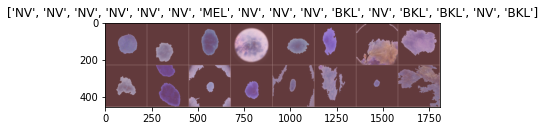

time: 819 ms (started: 2022-10-31 06:56:40 +00:00)


In [28]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.6678, 0.5298, 0.5245])
    std = np.array([0.1333, 0.1476, 0.1590])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
data = next(iter(dataloaders['train']))
ps = data['target'].numpy()
l = np.where(ps==1.0)
l = l[1].astype(int)
# Make a grid from batch
out = torchvision.utils.make_grid(data['image'])
imshow(out, title=[class_names[x] for x in l])

In [29]:
from tqdm._tqdm_notebook import tqdm_notebook
def compute_predictions(model):
    model.eval()
    fusion_matrix = FusionMatrix(8)
    pred_lst=[]
    gt_lst=[]
    for i, sample in enumerate(dataloaders['val']):    
        images=sample['image']
        labels=sample['target']
        del sample
        images = images.to(device)
        labels=labels.numpy()
        outputs=model(images)
        outputs=outputs.detach()
        outputs=outputs.cpu()
        outputs=outputs.numpy()
        pred_lst.append(outputs)
        gt_lst.append(labels)
        del labels, outputs, images

    pred_lst=np.concatenate(pred_lst, axis=0)
    gt_lst=np.concatenate(gt_lst, axis=0)
    pred_lst2 = np.argmax(pred_lst, axis=1)
    gt_lst2 = np.argmax(gt_lst, axis=1)
    fusion_matrix.update(pred_lst2, gt_lst2)
    print("sensitivity-"+str(fusion_matrix.get_rec_per_class()))
    print("specicivity-"+str(fusion_matrix.get_pre_per_class()))
    print("Balanced Accuracy")
    print(fusion_matrix.get_balance_accuracy())
    print("Confusion Matrix")
    print(fusion_matrix.plot_confusion_matrix())
    print("f1-score")
    print(fusion_matrix.get_f1_score())
    
    #roc_auc = get_roc_auc(pred_lst, gt_lst)
    #print(roc_auc)
    auc_lst=[]
    acc_lst=[]
    for k in range(0,8):
        tmp_gt=gt_lst[:, k]
        tmp_pred=pred_lst[:,k]
        tmp_acc=accuracy_score(tmp_gt, tmp_pred.round())
        acc_lst.append(tmp_acc)
        tmp_auc=roc_auc_score(tmp_gt, tmp_pred)
        auc_lst.append(tmp_auc)

    
    auc_lst=np.array(auc_lst)
    
    acc_lst=np.array(acc_lst)
    print("auc-list")
    print('\n')
    print(auc_lst)
    print("accuracy-list")
    print('\n')
    print(acc_lst)
    auc=np.mean(auc_lst)
    acc = np.mean(acc_lst)
    print("mean-auc"+str(auc))
    print("mean-auc"+str(acc))
    f1s=0.0
    return auc,acc,pred_lst,gt_lst

time: 3.73 ms (started: 2022-10-31 06:56:41 +00:00)


In [30]:
model=models.densenet121(pretrained=False)
model.classifier=nn.Sequential(nn.Linear(1024, 8), nn.Sigmoid())
checkpoint = torch.load('../input/isic2019segdensenet121/resnet50_wt_epoch_11_batch_78_auc_0.7143.pt')
model.load_state_dict(checkpoint['model_state_dict'],strict=False)
del checkpoint
model.to(device)

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

time: 1.71 s (started: 2022-10-31 06:56:42 +00:00)


sensitivity-[0.51263158 0.84615385 0.24068768 0.         0.00362976 0.
 0.         0.        ]
specicivity-[0.33061779 0.68359725 0.34008097 0.         0.33333333 0.
 0.         0.        ]
Balanced Accuracy
0.2003878585312056
Confusion Matrix
Figure(432x288)
f1-score
0.18091002208607407
auc-list


[0.74393027 0.83264402 0.80331469 0.67736623 0.69130737 0.69294118
 0.59193591 0.71302072]
accuracy-list


[0.8387218  0.72763158 0.86879699 0.96578947 0.89642857 0.9906015
 0.99003759 0.97518797]
mean-auc0.7183075465171218
mean-auc0.9066494360902255


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in long_scalars
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in true_divide


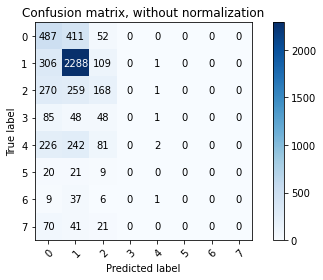

time: 24.9 s (started: 2022-10-31 06:56:44 +00:00)


In [31]:
auc1,acc1,pred_lst1,gt_lst1=compute_predictions(model)

<class 'PIL.Image.Image'>
(224, 224)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  after removing the cwd from sys.path.


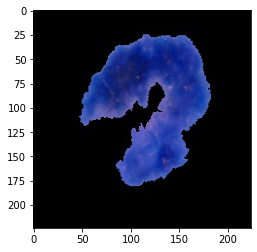

time: 210 ms (started: 2022-10-31 06:57:09 +00:00)


In [32]:

from matplotlib.pyplot import imshow
image = Image.open('../input/pp2isic/preprocessed-segment/ISIC_0033754.jpg').convert('RGB')
print(type(image))
image = image.resize((224, 224), Image.ANTIALIAS)

print(image.size)
image = np.array(image)
image2 = np.float32(image) / 255
imshow(image)

In [33]:
image1 = Image.open('../input/pp2isic/preprocessed-segment/ISIC_0033754.jpg').convert('RGB')
preprocess = data_transforms['val']
tensor = preprocess(image1)
tensor2 = tensor.unsqueeze(0)
tensor2 = tensor2.float()

time: 6.49 ms (started: 2022-10-31 06:57:09 +00:00)


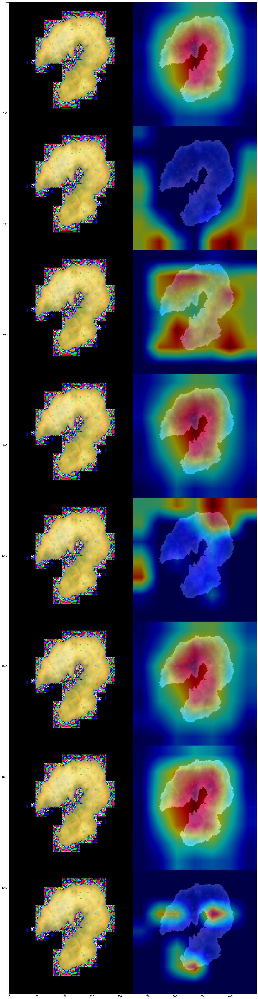

time: 2.86 s (started: 2022-10-31 06:57:10 +00:00)


In [34]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  This is separate from the ipykernel package so we can avoid doing imports until


(224, 224)


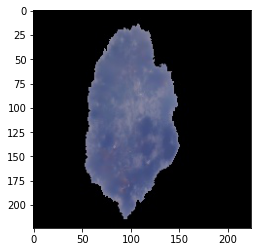

time: 461 ms (started: 2022-10-31 06:57:13 +00:00)


In [35]:
image = Image.open('../input/pp2isic/preprocessed-segment/ISIC_0033794.jpg').convert('RGB')
imshow(image)
image = image.resize((224, 224), Image.ANTIALIAS)

print(image.size)
image = np.array(image)
image2 = np.float32(image) / 255

In [36]:
image1 = Image.open('../input/pp1isic/preprocessed-hair/ISIC_0033794.jpg').convert('RGB')
preprocess = data_transforms['val']
tensor = preprocess(image1)
tensor2 = tensor.unsqueeze(0)
tensor2 = tensor2.float()

time: 10.6 ms (started: 2022-10-31 06:57:14 +00:00)


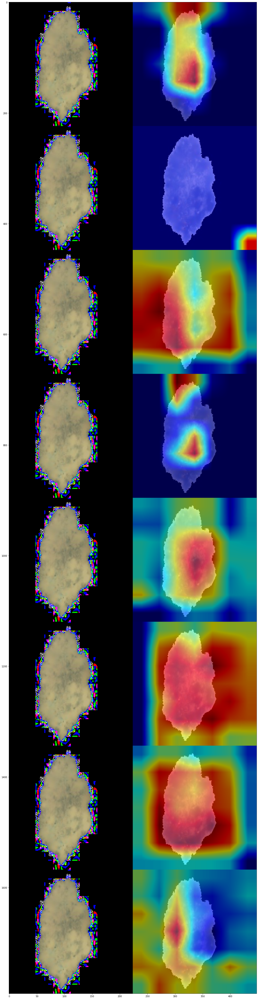

time: 2.74 s (started: 2022-10-31 06:57:14 +00:00)


In [37]:
target_layer = [model.features.denseblock4.denselayer16.conv2]
tensor2 = tensor2.to(device)
plt.figure(figsize=(40,80))
for x in range(0,8):
    cam = GradCAMPlusPlus(model=model, target_layers=target_layer)
    targets1 = [ClassifierOutputTarget(category=x)]
    grayscale_cam = cam(input_tensor=tensor2,targets=targets1)
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(image2, grayscale_cam, use_rgb=True)
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*image), visualization))
    if(x==0):
        imaget = images
    else:
        imaget = np.vstack((imaget,images))
    
imshow(Image.fromarray(imaget))